In [1]:
#!pip install --upgrade tensorflow keras

# Importar Librerias

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import math

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import class_weight
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.metrics import AUC
from sklearn.model_selection import RandomizedSearchCV
from scikeras.wrappers import KerasClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score



import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
import tensorflow
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense, Input
#from keras.utils.vis_utils import plot_model
from tensorflow.keras.utils import plot_model
tensorflow.__version__


from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split


In [3]:
df_train = pd.read_csv('https://raw.githubusercontent.com/JohannaKSV/DeepLearning/main/train_data.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/JohannaKSV/DeepLearning/main/test_data.csv')

#df_train = pd.read_csv('/content/train_data.csv')
#df_test = pd.read_csv('/content/test_data.csv')


In [4]:
df_train.head(5)

,ID,Bankruptcy,Realized.Sales.Gross.Profit.Growth.Rate,Operating.Expense.Rate,Operating.Profit.Per.Share..Yuan...,Gross.Profit.to.Sales,Tax.rate..A.,Current.Liability.to.Liability,Continuous.Net.Profit.Growth.Rate,Long.term.Liability.to.Current.Assets,...,Per.Share.Net.profit.before.tax..Yuan...,Continuous.interest.rate..after.tax.,Liability.Assets.Flag,Working.Capital.to.Total.Assets,Degree.of.Financial.Leverage..DFL.,Operating.Gross.Margin,Contingent.liabilities.Net.worth,Operating.Profit.Growth.Rate,Cash.Flow.to.Liability,Quick.Assets.Total.Assets
0,1,0,0.087661,1.900349e-04,0.131094,0.583345,0.000000,0.815892,0.395719,0.089276,...,0.223720,0.801737,0,0.839112,0.036551,0.591350,0.007401,0.913175,0.489822,0.138714
1,2,0,0.021892,5.371576e-04,0.086167,0.695478,0.209649,0.768636,0.163505,0.000000,...,0.324763,0.791203,0,0.908450,0.126752,0.766066,0.020514,0.849241,0.550247,0.704211
2,3,0,0.102249,2.178329e-04,0.157755,0.766934,0.272061,0.643316,0.181571,0.010180,...,0.360892,0.803126,0,0.865943,0.018152,0.687211,0.004363,0.865814,0.447168,0.398086
3,4,0,0.029972,4.915756e+10,0.249279,0.611580,0.288357,0.752782,0.409196,0.018603,...,0.152445,0.824732,0,0.806254,0.051284,0.715973,0.014162,0.843357,0.485163,0.617386
4,6,0,0.021164,1.206001e-04,0.239817,0.614250,0.000000,0.559498,0.286989,0.148687,...,0.217282,0.787010,0,0.769843,0.012872,0.704043,0.003050,0.884905,0.422001,0.187121


In [5]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2050 entries, 0 to 2049
Data columns (total 65 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   ID                                                  2050 non-null   int64  
 1   Bankruptcy                                          2050 non-null   int64  
 2   Realized.Sales.Gross.Profit.Growth.Rate             2050 non-null   float64
 3   Operating.Expense.Rate                              2050 non-null   float64
 4   Operating.Profit.Per.Share..Yuan...                 2050 non-null   float64
 5   Gross.Profit.to.Sales                               2050 non-null   float64
 6   Tax.rate..A.                                        2050 non-null   float64
 7   Current.Liability.to.Liability                      2050 non-null   float64
 8   Continuous.Net.Profit.Growth.Rate                   2050 non-null   float64
 9

In [6]:
# Identificar si hay valores NaN en las columnas
nan_count = df_train.isnull().sum()

# Identificar columnas con solo espacios en blanco
spaces_count = (df_train.applymap(lambda x: isinstance(x, str) and x.strip() == '')).sum()

# Mostrar el número de valores NaN y espacios por columna
print("Valores NaN por columna:")
print(nan_count)
print("\nColumnas con solo espacios:")
print(spaces_count)

# Ver si hay columnas con NaN o espacios
if nan_count.any() > 0 or spaces_count.any() > 0:
    print("\nExisten columnas con valores NaN o con solo espacios.")
else:
    print("\nNo hay valores NaN ni columnas con solo espacios.")

Valores NaN por columna:
ID                                         0
Bankruptcy                                 0
Realized.Sales.Gross.Profit.Growth.Rate    0
Operating.Expense.Rate                     0
Operating.Profit.Per.Share..Yuan...        0
                                          ..
Operating.Gross.Margin                     0
Contingent.liabilities.Net.worth           0
Operating.Profit.Growth.Rate               0
Cash.Flow.to.Liability                     0
Quick.Assets.Total.Assets                  0
Length: 65, dtype: int64

Columnas con solo espacios:
ID                                         0
Bankruptcy                                 0
Realized.Sales.Gross.Profit.Growth.Rate    0
Operating.Expense.Rate                     0
Operating.Profit.Per.Share..Yuan...        0
                                          ..
Operating.Gross.Margin                     0
Contingent.liabilities.Net.worth           0
Operating.Profit.Growth.Rate               0
Cash.Flow.to.Liabilit

C:\Users\WD\AppData\Local\Temp\ipykernel_36492\2279251569.py:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  spaces_count = (df_train.applymap(lambda x: isinstance(x, str) and x.strip() == '')).sum()


# Exploración de los datos para su entendimiento dentro del contexto organizacional

In [7]:
df_train = df_train.drop('ID', axis=1)
df_train.describe()

,Bankruptcy,Realized.Sales.Gross.Profit.Growth.Rate,Operating.Expense.Rate,Operating.Profit.Per.Share..Yuan...,Gross.Profit.to.Sales,Tax.rate..A.,Current.Liability.to.Liability,Continuous.Net.Profit.Growth.Rate,Long.term.Liability.to.Current.Assets,Total.assets.to.GNP.price,...,Per.Share.Net.profit.before.tax..Yuan...,Continuous.interest.rate..after.tax.,Liability.Assets.Flag,Working.Capital.to.Total.Assets,Degree.of.Financial.Leverage..DFL.,Operating.Gross.Margin,Contingent.liabilities.Net.worth,Operating.Profit.Growth.Rate,Cash.Flow.to.Liability,Quick.Assets.Total.Assets
count,2050.000000,2050.000000,2.050000e+03,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2.050000e+03,2.050000e+03,...,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000
mean,0.030244,0.052426,1.143592e+10,0.168423,0.660301,0.149762,0.793474,0.289170,9.294008e+07,1.131508e+06,...,0.253212,0.813889,0.000488,0.841137,0.061406,0.659530,0.020629,0.870736,0.528420,0.462103
std,0.171300,0.037346,6.637064e+10,0.074822,0.065176,0.167852,0.185160,0.086326,1.985623e+09,3.534875e+07,...,0.089347,0.038671,0.022086,0.062363,0.047696,0.064301,0.019282,0.028070,0.084171,0.211477
min,0.000000,0.005576,1.816459e-05,0.026690,0.485416,0.000000,0.019372,0.128763,0.000000e+00,2.043140e-05,...,0.011441,0.733181,0.000000,0.628993,0.000000,0.449928,0.001931,0.808653,0.078139,0.004725
25%,0.000000,0.022660,3.866010e-04,0.107202,0.609787,0.000000,0.679179,0.219818,0.000000e+00,1.941380e-03,...,0.182113,0.783223,0.000000,0.799064,0.027581,0.608820,0.005786,0.848945,0.462781,0.295769
50%,0.000000,0.039844,2.890552e-03,0.153541,0.655394,0.107021,0.844793,0.275462,3.566712e-03,6.752853e-03,...,0.238402,0.812021,0.000000,0.844362,0.046901,0.654584,0.012352,0.869933,0.519719,0.458141
75%,0.000000,0.074134,2.040574e+06,0.219785,0.713574,0.258826,0.948177,0.353458,2.293107e-02,2.145355e-02,...,0.320693,0.845336,0.000000,0.884139,0.084784,0.712043,0.029781,0.893693,0.596492,0.620841
max,1.000000,0.197622,8.153957e+11,0.402487,0.803413,0.966891,1.000000,1.000000,6.747688e+10,1.172719e+09,...,0.761559,0.882713,1.000000,0.987732,1.000000,0.808339,0.096714,0.921276,1.000000,0.989621


In [26]:
df_train.shape

(2050, 64)

# Explicación detallada de variables financieras

- **ROA.B..before.interest.and.depreciation.after.tax**  
  _Rentabilidad sobre activos antes de intereses, depreciación e impuestos._  
  Mide la eficiencia de la empresa para generar utilidades usando sus activos, excluyendo efectos de intereses, impuestos y depreciación. Útil para comparar empresas con diferentes estructuras fiscales o de financiamiento.

- **Quick.Asset.Turnover.Rate**  
  _Tasa de rotación de activos líquidos._  
  Indica cuántas veces los activos líquidos (efectivo, cuentas por cobrar, inversiones temporales) se convierten en ventas en un período determinado. Mide eficiencia operativa y liquidez.

- **Debt.ratio..**  
  _Ratio de deuda._  
  Representa el porcentaje de activos financiados con deuda. Se calcula como:  
  `Deuda total / Activos totales`.  
  Un valor alto puede implicar alto riesgo financiero.

- **Retained.Earnings.to.Total.Assets**  
  _Proporción de ganancias retenidas sobre activos totales._  
  Mide qué parte de los activos totales ha sido financiada con utilidades retenidas en lugar de deuda o capital nuevo.

- **Total.debt.Total.net.worth**  
  _Relación entre deuda total y patrimonio neto._  
  Indica la proporción de deuda respecto al patrimonio de los accionistas. Ayuda a evaluar el apalancamiento financiero.

- **Fixed.Assets.to.Assets**  
  _Proporción de activos fijos sobre activos totales._  
  Evalúa cuánto del total de activos está invertido en activos fijos como maquinaria, terrenos, etc. Alto valor puede reflejar baja flexibilidad.

- **Total.Asset.Growth.Rate**  
  _Tasa de crecimiento de los activos totales._  
  Mide el crecimiento de los activos totales de la empresa entre dos periodos. Útil para analizar expansión o contracción.

- **Inventory.and.accounts.receivable.Net.value**  
  _Valor neto de inventarios y cuentas por cobrar._  
  Muestra los recursos en inventario y por cobrar después de restar provisiones por incobrables o deterioros.

- **Net.Income.Flag**  
  _Indicador de si el ingreso neto es positivo o negativo._  
  Variable binaria (1 o 0) que indica si la empresa tuvo utilidades (1) o pérdidas (0) netas.

- **Per.Share.Net.profit.before.tax..Yuan...**  
  _Beneficio por acción antes de impuestos (en yuanes)._  
  Mide la ganancia generada por acción antes de impuestos. Es un indicador clave de rentabilidad para los accionistas.

- **Continuous.interest.rate..after.tax.**  
  _Tasa de interés continua después de impuestos._  
  Representa el costo financiero ajustado por impuestos bajo un modelo de interés compuesto continuo.

- **Liability.Assets.Flag**  
  _Indicador de la relación entre pasivos y activos._  
  Variable binaria que indica si los pasivos superan los activos (riesgo de insolvencia).

- **Working.Capital.to.Total.Assets**  
  _Relación entre el capital de trabajo y los activos totales._  
  Mide la liquidez a corto plazo, calculada como:  
  `(Activos corrientes - Pasivos corrientes) / Activos totales`.

- **Degree.of.Financial.Leverage..DFL.**  
  _Grado de apalancamiento financiero._  
  Muestra el impacto de los costos financieros fijos sobre las utilidades. A mayor DFL, mayor riesgo financiero.

- **Operating.Gross.Margin**  
  _Margen bruto operativo._  
  Calculado como:  
  `(Ingresos operativos - Costos operativos) / Ingresos operativos`.  
  Mide la rentabilidad básica del negocio.

- **Contingent.liabilities.Net.worth**  
  _Relación entre contingencias (pasivos posibles) y patrimonio neto._  
  Mide el posible riesgo financiero si se concretan pasivos contingentes.

- **Operating.Profit.Growth.Rate**  
  _Tasa de crecimiento del beneficio operativo._  
  Mide el cambio porcentual en las utilidades operativas de un periodo a otro.

- **Cash.Flow.to.Liability**  
  _Relación entre flujo de caja y pasivos._  
  Muestra la capacidad de la empresa para cubrir sus pasivos con el flujo de caja operativo.

- **Quick.Assets.Total.Assets**  
  _Proporción de activos líquidos sobre activos totales._  
  Mide la liquidez de corto plazo sin incluir inventarios:  
  `(Efectivo + Cuentas por cobrar) / Activos totales`.


In [8]:
#sns.pairplot(df_train, kind="scatter",diag_kind="kde")
#plt.show()

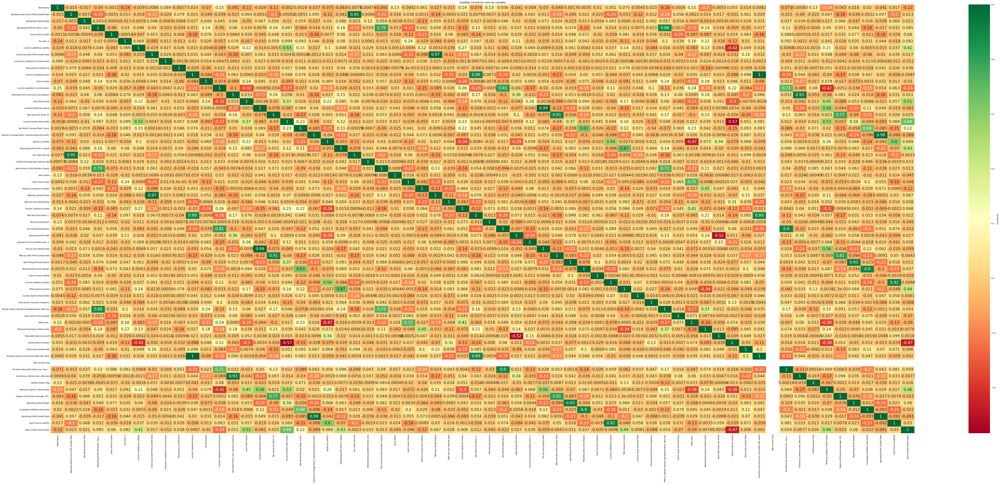

In [9]:
plt.figure(figsize=(100,40))
sns.heatmap(df_train.corr(method='pearson'),annot=True,cmap='RdYlGn',cbar_kws={'label':'Correlación'},annot_kws={'size': 20})
plt.title('HeatMap Correlacion entre las variables')
plt.show()

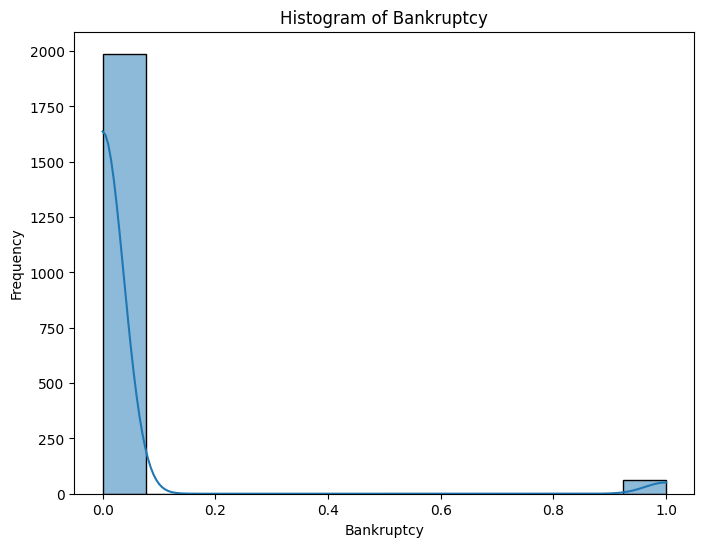

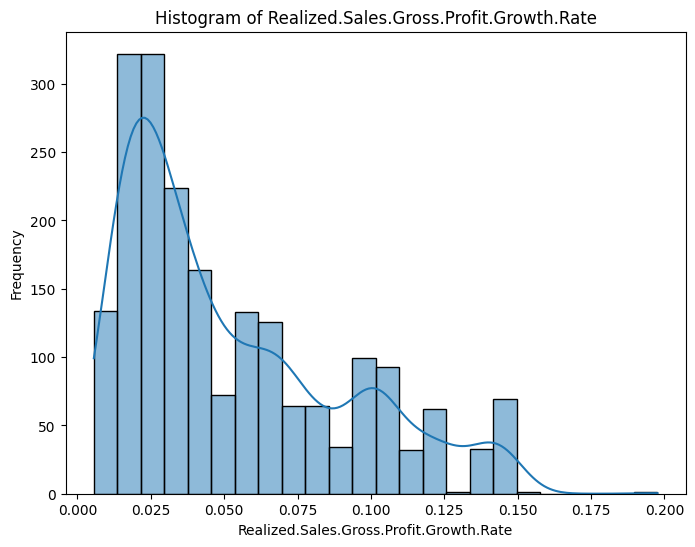

In [ ]:
# Iterate through each column and create a histogram
for column in df_train.columns:
    plt.figure(figsize=(8, 6))  # Adjust figure size as needed
    sns.histplot(df_train[column], kde=True)  # Use seaborn's histplot with KDE
    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()


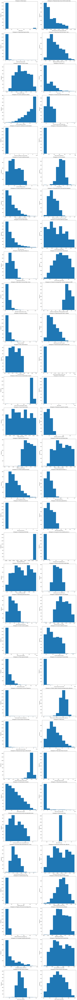

In [ ]:
# Número de columnas (2 gráficos por fila)
n_cols = 2
# Número de filas, calculado según el número total de columnas que se van a graficar
n_rows = (len(df_train.columns) + 1) // n_cols  # +1 para redondear hacia arriba si hay un número impar de columnas

# Crear la figura y los ejes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 6))

# Asegurarse de que axes sea un arreglo unidimensional para iterar fácilmente
axes = axes.flatten()

# Iterar sobre las columnas y graficar un histograma en cada subgráfico
for i, column in enumerate(df_train.columns):
    # Crear los intervalos (bins) y calcular las frecuencias
    hist, bins = np.histogram(df_train[column], bins=10)

    # Crear el gráfico de barras con matplotlib en el subgráfico correspondiente
    axes[i].bar(bins[:-1], hist, width=np.diff(bins), align='edge')
    axes[i].set_title(f'Histogram of {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')

# Ajustar los márgenes entre las subgráficas
plt.tight_layout()

# Mostrar las gráficas
plt.show()

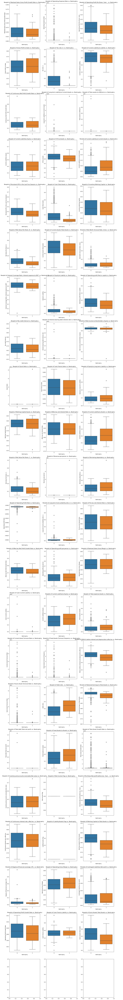

In [ ]:
# Número de columnas (3 gráficos por fila)
n_cols = 3
# Número de filas, se calcula según el número de columnas
n_rows = (len(df_train.columns) - 1) // n_cols + 1  # Restamos 1 porque 'Bankruptcy' es la primera columna

# Crear una figura con los subgráficos
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 6))

# Asegurarse de que las subgráficas sean un arreglo unidimensional para iterar fácilmente
axes = axes.flatten()

# Iterar sobre las columnas y dibujar el boxplot en las subgráficas
for i, column in enumerate(df_train.columns[1:]):
    sns.boxplot(x='Bankruptcy', y=column, data=df_train, ax=axes[i])  # Usamos el eje correspondiente
    axes[i].set_title(f'Boxplot of {column} vs. Bankruptcy')
    axes[i].set_xlabel('Bankruptcy')
    axes[i].set_ylabel(column)

# Ajustar los márgenes entre las subgráficas
plt.tight_layout()

# Mostrar las gráficas
plt.show()

# Limpieza de datos

In [8]:
scaler = StandardScaler()
#df_train_scaled = scaler.fit_transform(df_train.drop('Bankruptcy', axis=1))
#df_train_scaled = pd.DataFrame(df_train_scaled, columns=df_train.columns[1:]) # Data Leakage

In [9]:
X = df_train.drop('Bankruptcy', axis=1)
y = df_train['Bankruptcy']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y) # abc added stratify
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)


In [10]:
X_train.shape[1]

63

In [11]:
# input_dim = X_train.shape[1]
# model = Sequential([
#     Input(shape=(input_dim,)),
#     Dense(12, activation='relu'),
#     Dense(8, activation='relu'),
#     Dense(1, activation='sigmoid')
# ])

# Entrenamiento del modelo

### Plot_history Funcion

In [11]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

def plot_history(history, model, X_val, y_val):
    """
    Plots training and validation loss, AUC, and the ROC curve.

    Parameters:
        history: Keras History object or dict with keys:
                 'loss', 'val_loss', 'auc', 'val_auc'.
        model: Trained Keras model.
        X_val: Validation features.
        y_val: Validation labels.
    """
    hist = history.history if hasattr(history, 'history') else history

    # Final metrics
    print(f"Train Loss final: {hist['loss'][-1]:.3f}, "
          f"Train AUC final: {hist['auc'][-1]:.3f}")
    print(f"Validation Loss final: {hist['val_loss'][-1]:.3f}, "
          f"Validation AUC final: {hist['val_auc'][-1]:.3f}")

    # ROC curve
    y_pred_proba = model.predict(X_val).ravel()
    fpr, tpr, _ = roc_curve(y_val, y_pred_proba)
    roc_auc = auc(fpr, tpr)

    # Crear figura con 3 subplots
    plt.figure(figsize=(18, 5))

    # Subplot 1: Loss
    plt.subplot(1, 3, 1)
    plt.plot(hist['loss'], label='Training Loss', marker='o')
    plt.plot(hist['val_loss'], label='Validation Loss', marker='o')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training vs. Validation Loss')
    plt.legend()
    plt.grid(True)

    # Subplot 2: AUC
    plt.subplot(1, 3, 2)
    plt.plot(hist['auc'], label='Training AUC', marker='o')
    plt.plot(hist['val_auc'], label='Validation AUC', marker='o')
    plt.xlabel('Epochs')
    plt.ylabel('AUC')
    plt.title('Training vs. Validation AUC')
    plt.legend()
    plt.grid(True)

    # Subplot 3: ROC
    plt.subplot(1, 3, 3)
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.title('ROC Curve')
    plt.legend(loc='lower right')
    plt.grid(True)

    plt.tight_layout()
    plt.show()


### Modelo 1 (10 capas todas relu final sigmoide 64 neuronas)

In [12]:

# Calcular pesos de clase para balancear
class_weights = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)
class_weights = dict(enumerate(class_weights))

# Crear el modelo con 10 capas ocultas
model1 = Sequential()
model1.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))

# Añadir 9 capas ocultas más
for _ in range(9):
    model1.add(Dense(64, activation='relu'))
    model1.add(Dropout(0.3))  # Para regularización

# Capa de salida
model1.add(Dense(1, activation='sigmoid'))

# Compilar el modelo con AUC como métrica
model1.compile(optimizer=Adam(learning_rate=0.001),
              loss='binary_crossentropy',
              metrics=['accuracy', AUC(name='auc')])

# Early stopping basado en val_auc
early_stop = EarlyStopping(monitor='val_auc', patience=5, restore_best_weights=True, mode='max')



C:\Users\WD\AppData\Roaming\Python\Python310\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
# Entrenar el modelo
history = model1.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=100,
    batch_size=32,
    class_weight=class_weights,
    callbacks=[early_stop],
    verbose=1
)


Train Loss final: 0.215, Train AUC final: 0.966
Validation Loss final: 0.295, Validation AUC final: 0.829
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


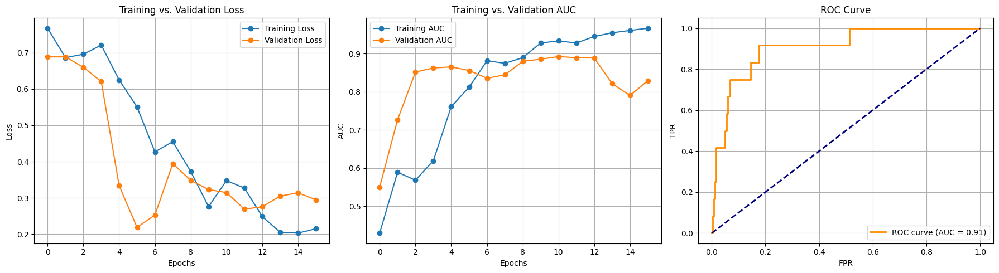

In [21]:
plot_history(history, model1, X_val, y_val)


##### Guardar modelo

In [24]:
model1.save('modelo_1.keras')

In [21]:
from tensorflow.keras.models import load_model

# Cargar el modelo
model1 = load_model('modelo_1.keras')

#### Busqueda Hiperparametros

In [13]:


def create_model(learning_rate=0.001, dropout_rate=0.3, hidden_layers=10, units=64):
    model = Sequential()
    model.add(Dense(units, input_dim=X_train.shape[1], activation='relu'))

    for _ in range(hidden_layers - 1):  # Ya agregamos una arriba
        model.add(Dense(units, activation='relu'))
        model.add(Dropout(dropout_rate))

    model.add(Dense(1, activation='sigmoid'))

    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss='binary_crossentropy',
                  metrics=['accuracy', AUC(name='auc')])
    return model


In [14]:
from scikeras.wrappers import KerasClassifier

keras_clf = KerasClassifier(model=create_model, verbose=0)


In [15]:
from scipy.stats import uniform, randint

param_distributions = {
    "model__learning_rate": uniform(1e-4, 1e-2),        # entre 0.0001 y 0.01
    "model__dropout_rate": uniform(0.1, 0.5),           # entre 0.1 y 0.6
    "model__hidden_layers": randint(3, 11),             # entre 3 y 10 capas
    "model__units": [32, 64, 128],                      # unidades por capa
    "batch_size": [16, 32, 64],
    "epochs": [30, 50, 100]
}
param_grid = {
    'model__learning_rate': [0.001, 0.0005],
    'model__dropout_rate': [0.2, 0.3],
    'model__hidden_layers': [5, 10],
    'model__units': [64, 128],
    'batch_size': [32],
    'epochs': [50]
}

##### Gridsearch

In [16]:

early_stop = EarlyStopping(monitor='val_auc', patience=5, restore_best_weights=True, mode='max')

# Configurar el GridSearchCV
grid_search = GridSearchCV(
    estimator=keras_clf,
    param_grid=param_grid,
    scoring='roc_auc',
    cv=3,
    verbose=1
)

# Ajustar el modelo con los parámetros adicionales
grid_search.fit(
    X_train, y_train,
    fit__validation_data=(X_val, y_val),
    fit__callbacks=[early_stop],
    fit__class_weight=class_weights
)


AttributeError: 'super' object has no attribute '__sklearn_tags__'

##### Randomsearch

In [18]:
random_search = RandomizedSearchCV(
    estimator=keras_clf,
    param_distributions=param_distributions,
    n_iter=10,
    scoring='roc_auc',
    cv=3,
    verbose=1,
    random_state=42
)

# Notá los nombres con 'fit__'
random_search.fit(
    X_train,
    y_train,
    fit__validation_data=(X_val, y_val),
    fit__callbacks=[early_stop],
    fit__class_weight=class_weights
)

AttributeError: 'super' object has no attribute '__sklearn_tags__'

In [ ]:
print("Mejores parámetros:", random_search.best_params_)
print("Mejor AUC:", random_search.best_score_)


### Modelo 2

In [17]:
from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)
class_weights = dict(enumerate(class_weights))

# Crear el modelo con 10 capas ocultas
model2 = Sequential()
model2.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))  # Capa de entrada

# Añadir 9 capas ocultas con diferentes funciones de activación
activation_functions = ['relu', 'tanh', 'sigmoid', 'leaky_relu', 'elu']

for i in range(9):
    # Alternar entre las funciones de activación de la lista
    activation_func = activation_functions[i % len(activation_functions)]  # Rotar funciones
    model2.add(Dense(64, activation=activation_func))
    model2.add(Dropout(0.3))  # Regularización con Dropout

# Capa de salida
model2.add(Dense(1, activation='sigmoid'))  # Capa de salida para clasificación binaria

# Compilar el modelo con AUC como métrica
model2.compile(optimizer=Adam(learning_rate=0.001),
              loss='binary_crossentropy',
              metrics=['accuracy', AUC(name='auc')])

# Early stopping basado en val_auc
early_stop = EarlyStopping(monitor='val_auc', patience=5, restore_best_weights=True, mode='max')

# Resumen del modelo
model2.summary()

C:\Users\WD\AppData\Roaming\Python\Python310\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_11 (Dense)                │ (None, 64)             │         4,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 41,601 (162.50 KB)

 Trainable params: 41,601 (162.50 KB)

 Non-trainable params: 0 (0.00 B)

In [18]:
# Entrenar el modelo
history = model2.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=100,
    batch_size=32,
    class_weight=class_weights,
    callbacks=[early_stop],
    verbose=1
)


Epoch 1/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.5834 - auc: 0.4872 - loss: 0.7887 - val_accuracy: 0.9707 - val_auc: 0.6242 - val_loss: 0.6101
Epoch 2/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6880 - auc: 0.5175 - loss: 0.6670 - val_accuracy: 0.0293 - val_auc: 0.5639 - val_loss: 0.7380
Epoch 3/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4298 - auc: 0.4492 - loss: 0.7022 - val_accuracy: 0.0293 - val_auc: 0.6438 - val_loss: 0.7100
Epoch 4/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4151 - auc: 0.4176 - loss: 0.7133 - val_accuracy: 0.0366 - val_auc: 0.8049 - val_loss: 0.7075
Epoch 5/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5683 - auc: 0.5572 - loss: 0.7112 - val_accuracy: 0.4463 - val_auc: 0.8424 - val_loss: 0.6951
Epoch 6/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5350 - auc: 0.4934 - loss: 0.7652 - val_accuracy: 0.8634 - val_auc: 0.8876 - val_loss: 0.6245
Epoch 7/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/

Train Loss final: 0.274, Train AUC final: 0.937
Validation Loss final: 0.278, Validation AUC final: 0.871
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


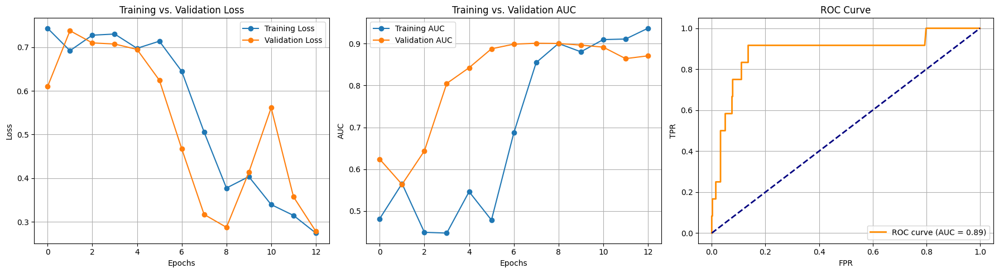

In [19]:
plot_history(history, model2, X_val, y_val)


##### Guardar modelo

In [22]:
model2.save('modelo_2.keras')

#### Tuner Modelo 2

In [52]:
import keras_tuner
import keras
import tensorflow as tf
import random

In [53]:
seed_value = 123
os.environ['PYTHONHASHSEED'] = str(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)

In [54]:
class_weights = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)
class_weights = dict(enumerate(class_weights))



In [63]:
import random
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, LeakyReLU, ELU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import AUC

def build_model(hp):
    # Mezclar funciones de activación para rotar en orden aleatorio
    activation_functions = ['relu', 'tanh', 'sigmoid', 'softplus', 'selu', 'leaky_relu', 'elu']
    random.shuffle(activation_functions)

    # Hiperparámetros
    learning_rate = hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4, 5e-2, 5e-3, 5e-4])
    hidden_layers = hp.Int('hidden_layers', min_value=6, max_value=12)
    units = hp.Choice('units', [2, 8, 16, 32, 64, 128])

    # Modelo
    model = Sequential()
    model.add(Dense(units, input_shape=(X_train.shape[1],)))

    for i in range(hidden_layers):
        model.add(Dense(units))
        activation_name = activation_functions[i % len(activation_functions)]

        if activation_name == 'leaky_relu':
            model.add(LeakyReLU())
        elif activation_name == 'elu':
            model.add(ELU())
        else:
            model.add(Activation(activation_name))

    model.add(Dense(1, activation='sigmoid'))

    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='binary_crossentropy',
        metrics=['accuracy', AUC(name='auc')]
    )

    return model


In [64]:
from tensorflow.keras.layers import Dense, Dropout, Activation, LeakyReLU, ELU
from sklearn.utils import class_weight
import keras_tuner
from keras_tuner.tuners import RandomSearch


tuner = RandomSearch(
    build_model,
    objective='val_auc',
    max_trials=20,  
    executions_per_trial=1,  
    directory='tuner_dir',
    project_name='tuner1'
)


Reloading Tuner from tuner_dir\tuner1\tuner0.json


In [65]:
early_stopping = EarlyStopping(
    monitor='val_auc',
    patience=5,
    restore_best_weights=True,
    mode='max'
)


In [66]:
tuner.search(
    X_train, y_train,
    validation_data=(X_val, y_val),
    class_weight=class_weights,
    callbacks=[early_stopping]
)


In [67]:
# Obtener mejores hiperparámetros
best_hps = tuner.get_best_hyperparameters(1)[0]

# Crear modelo con los mejores hiperparámetros
model_tuner = tuner.hypermodel.build(best_hps)

# Obtener los valores de batch_size y epochs si están definidos
batch_size = best_hps.values['batch_size'] if 'batch_size' in best_hps.values else 32
epochs = best_hps.values['epochs'] if 'epochs' in best_hps.values else 100

# Entrenar el modelo final
history = model_tuner.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    batch_size=batch_size,
    epochs=epochs,
    callbacks=[early_stopping],
    class_weight=class_weights
)


Epoch 1/100


C:\Users\WD\AppData\Roaming\Python\Python310\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.4746 - auc: 0.5695 - loss: 0.7734 - val_accuracy: 0.9707 - val_auc: 0.8032 - val_loss: 0.5166
Epoch 2/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6918 - auc: 0.6680 - loss: 0.7036 - val_accuracy: 0.7634 - val_auc: 0.8780 - val_loss: 0.4843
Epoch 3/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7796 - auc: 0.8638 - loss: 0.4798 - val_accuracy: 0.8585 - val_auc: 0.9144 - val_loss: 0.2827
Epoch 4/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8438 - auc: 0.9346 - loss: 0.3129 - val_accuracy: 0.9122 - val_auc: 0.8994 - val_loss: 0.1715
Epoch 5/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9005 - auc: 0.9623 - loss: 0.2204 - val_accuracy: 0.9098 - val_auc: 0.9083 - val_loss: 0.2214
Epoch 6/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9059 - auc: 0.9700 - loss: 0.1902 - val_accuracy: 0.9024 - val_auc: 0.8968 - val_loss: 0.2006
Epoch 7/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accur

Train Loss final: 0.128, Train AUC final: 0.982
Validation Loss final: 0.341, Validation AUC final: 0.887
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


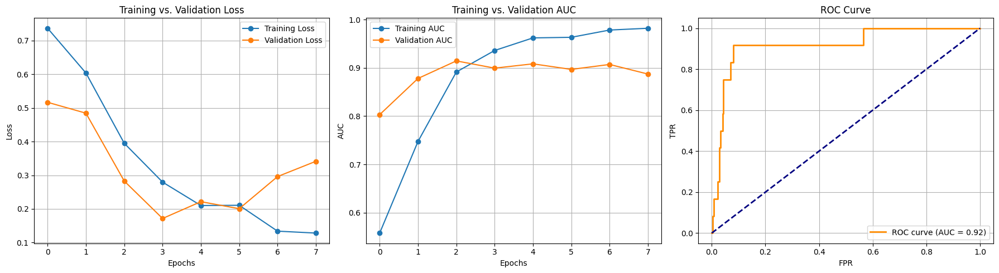

In [68]:
plot_history(history, model_tuner, X_val, y_val)

##### Guardar modelo tuner

In [69]:
model_tuner.save('modeloHiper2.keras')

In [ ]:
from tensorflow.keras.models import load_model
# modeloHiper2 = load_model('modeloHiper2.keras')

### Modelo 3

In [19]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.metrics import AUC
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# Calcular class_weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)
class_weights = dict(enumerate(class_weights))

# Crear el modelo sin regularización
model3 = Sequential()
model3.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))  # Capa de entrada

# Funciones de activación ampliadas
activation_functions = ['relu', 'tanh', 'sigmoid', 'elu', 'selu', 'swish']

# Añadir capas ocultas
for i in range(9):
    activation_func = activation_functions[i % len(activation_functions)]
    model3.add(Dense(64, activation=activation_func))

# Capa de salida
model3.add(Dense(1, activation='sigmoid'))

# Compilar el modelo
model3.compile(optimizer=Adam(learning_rate=0.001),
               loss='binary_crossentropy',
               metrics=['accuracy', AUC(name='auc')])

# Early stopping
early_stop = EarlyStopping(monitor='val_auc', patience=5, restore_best_weights=True, mode='max')

# Resumen
model3.summary()



C:\Users\WD\AppData\Roaming\Python\Python310\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_33 (Dense)                │ (None, 64)             │         4,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_36 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 41,601 (162.50 KB)

 Trainable params: 41,601 (162.50 KB)

 Non-trainable params: 0 (0.00 B)

In [20]:
# Entrenar
history = model3.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=100,
    batch_size=32,
    class_weight=class_weights,
    callbacks=[early_stop],
    verbose=1
)


Epoch 1/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9483 - auc: 0.4119 - loss: 0.6977 - val_accuracy: 0.0293 - val_auc: 0.8677 - val_loss: 0.7452
Epoch 2/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5799 - auc: 0.7409 - loss: 0.6536 - val_accuracy: 0.7220 - val_auc: 0.9203 - val_loss: 0.8805
Epoch 3/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8382 - auc: 0.9154 - loss: 0.4182 - val_accuracy: 0.8780 - val_auc: 0.8887 - val_loss: 0.3346
Epoch 4/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8918 - auc: 0.9547 - loss: 0.2684 - val_accuracy: 0.9220 - val_auc: 0.8700 - val_loss: 0.2370
Epoch 5/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9154 - auc: 0.9538 - loss: 0.2014 - val_accuracy: 0.8878 - val_auc: 0.9101 - val_loss: 0.3302
Epoch 6/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9333 - auc: 0.9369 - loss: 0.1836 - val_accuracy: 0.9000 - val_auc: 0.8880 - val_loss: 0.2596
Epoch 7/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/

Train Loss final: 0.200, Train AUC final: 0.972
Validation Loss final: 0.254, Validation AUC final: 0.859
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


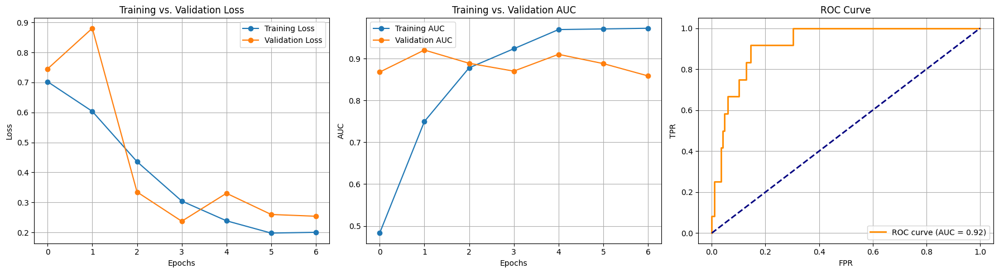

In [21]:
plot_history(history, model3, X_val, y_val)


##### Guardar modelo

In [23]:
model3.save('modelo_3.keras')

# Exportar Modelo

In [22]:
from tensorflow.keras.models import load_model

# Cargar el modelo
# model1 = load_model('modelo_1.keras')
# model2 = load_model('modelo_2.keras')

In [24]:
import os
import pandas as pd

test_data = pd.read_csv('test_data.csv')


def generate_submission(model, test_data, scaler=None, submission_folder='Submissions', model_name='model'):
    """
    Genera el archivo de submission para Kaggle.

    Parámetros:
    - model: el modelo entrenado para hacer las predicciones.
    - test_data: el conjunto de datos de prueba, que debe contener la columna 'ID'.
    - scaler: opcionalmente, el escalador (por ejemplo, un StandardScaler) si los datos fueron escalados.
    - submission_folder: carpeta donde se guardará el archivo de submission.
    - model_name: nombre personalizado del modelo para el archivo de submission.
    """
    
    # Verificar si la carpeta de submissions existe, si no, crearla
    if not os.path.exists(submission_folder):
        os.makedirs(submission_folder)
    
    # Separar las características del conjunto de prueba (eliminando la columna 'ID')
    X_test = test_data.drop('ID', axis=1)
    
    # Si el scaler está presente, transformar los datos de prueba
    if scaler:
        X_test = scaler.transform(X_test)
    
    # Realizar las predicciones con el modelo
    predictions = model.predict(X_test)  # Las predicciones de la clase 1
    
    # Aplanar las predicciones si es necesario (debe ser un array unidimensional)
    predictions = predictions.flatten()

    # Crear el archivo de submission con las columnas correctas
    submission = pd.DataFrame({
        'ID': test_data['ID'],  # Mantener la columna 'ID' del conjunto de prueba
        'Bankruptcy': predictions  # Cambiar 'Probability' a 'Bankruptcy'
    })
    
    # Verificar las primeras filas del DataFrame para asegurarse de que está correcto
    print(submission.head())

    # Generar el nombre del archivo de submission con el nombre del modelo
    submission_file = os.path.join(submission_folder, f'submission_{model_name}.csv')

    # Guardar el archivo de submission en la carpeta especificada
    submission.to_csv(submission_file, index=False, header=True)

    print(f"Archivo '{submission_file}' generado correctamente.")


#### Exportar modelo 1

In [45]:
# Asumiendo que ya tienes tu modelo entrenado (model1) y tu conjunto de prueba (test_data)
generate_submission(model1, test_data, scaler, model_name="Modelo_1 Sin Tuning") 


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
   ID  Bankruptcy
0   5    0.000004
1  14    0.835346
2  16    0.000025
3  26    0.000329
4  28    0.000020
Archivo 'Submissions\submission_Modelo_1 Sin Tuning.csv' generado correctamente.


#### Exportar modelo 2

In [46]:
generate_submission(model2, test_data, scaler, model_name="Modelo_2 Sin Tuning") 

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
   ID  Bankruptcy
0   5    0.079814
1  14    0.954967
2  16    0.079128
3  26    0.085271
4  28    0.079366
Archivo 'Submissions\submission_Modelo_2 Sin Tuning.csv' generado correctamente.


#### Exportar modelo tuneado

In [70]:
generate_submission(model_tuner, test_data, scaler, model_name="Modelo Tuning") 

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
   ID  Bankruptcy
0   5    0.004985
1  14    0.695997
2  16    0.009420
3  26    0.098811
4  28    0.007010
Archivo 'Submissions\submission_Modelo Tuning.csv' generado correctamente.


#### Exportar modelo 3

In [25]:
generate_submission(model3, test_data, scaler, model_name="Modelo 3") 

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
   ID  Bankruptcy
0   5    0.412196
1  14    0.893399
2  16    0.401327
3  26    0.347321
4  28    0.371186
Archivo 'Submissions\submission_Modelo 3.csv' generado correctamente.


# VIEJO

In [ ]:
model1.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


In [ ]:
history=model1.fit(X_train, y_train, epochs=100, batch_size=25)


Epoch 1/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9712 - loss: 0.3094
Epoch 2/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9705 - loss: 0.1802
Epoch 3/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9709 - loss: 0.1402
Epoch 4/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9695 - loss: 0.1215
Epoch 5/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9715 - loss: 0.1048
Epoch 6/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9701 - loss: 0.0948
Epoch 7/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9714 - loss: 0.0942
Epoch 8/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9710 - loss: 0.0846
Epoch 9/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9672 - loss: 0.0856
Epoch 10/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9692 - loss: 0.0847
Epoch 11/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9685 - loss: 0.0707
Epoch 12/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy:

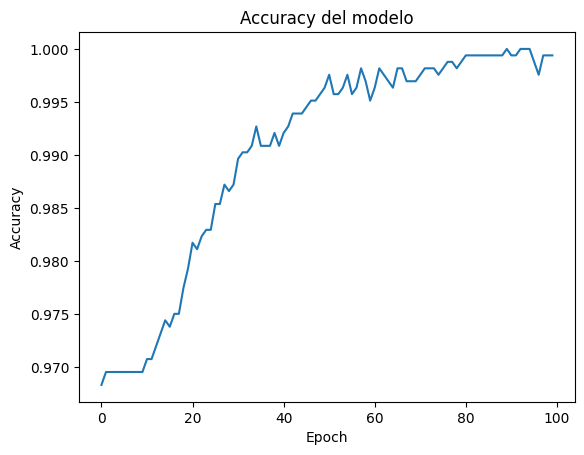

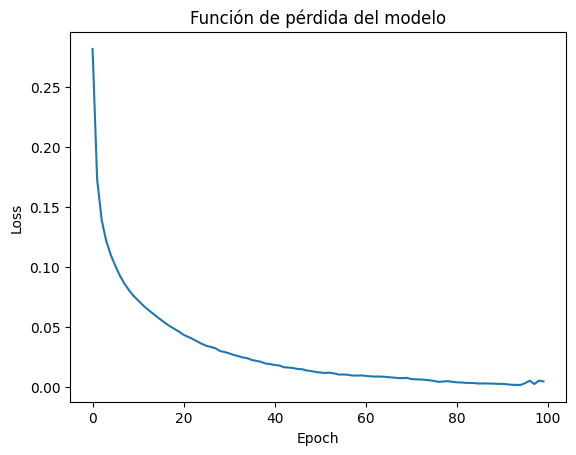

In [ ]:
# Graficar accuracy del modelo
plt.plot(history.history['accuracy'])
plt.title('Accuracy del modelo')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.show()
# Graficar la función de pérdida evaluada
plt.plot(history.history['loss'])
plt.title('Función de pérdida del modelo')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.show()

In [ ]:
_, accuracy = model1.evaluate(X_train, y_train)
print('Accuracy: %.2f' % (accuracy*100))

52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 0.0016
Accuracy: 100.00


## Evaluación del modelo

In [ ]:
test_loss, test_acc = model1.evaluate(X_val, y_val)

NameError: name 'model' is not defined

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
El accuracy del modelo es: 0.9609756097560975
La precisión del modelo es: 0.3333333333333333
La matriz de confusión es: [[390   8]
 [  8   4]]
El AUC del modelo es: 0.8515494137353433


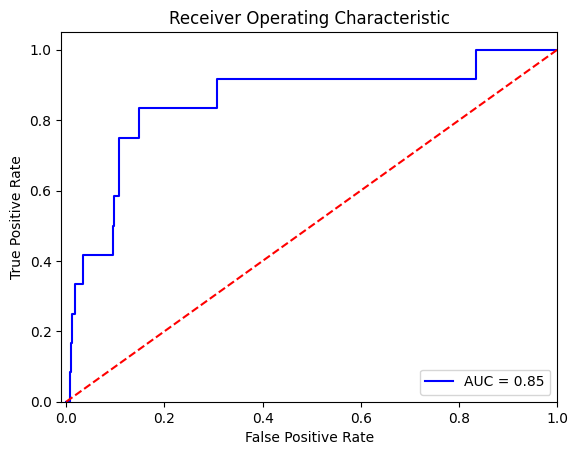

In [ ]:
# Hallar probabilidades y clasificación que predice el modelo con threshold de 0.5
predicciones = model1.predict(X_val)
y_pred = [round(x[0]) for x in predicciones]
# Imprimir métricas de desempeño
print("El accuracy del modelo es: "+str(accuracy_score(y_true=y_val, y_pred=y_pred)))
print("La precisión del modelo es: "+str(precision_score(y_true=y_val, y_pred=y_pred)))
print("La matriz de confusión es: "+str(confusion_matrix(y_true=y_val, y_pred=y_pred)))

fpr, tpr, thresholds = metrics.roc_curve(y_test, predicciones, pos_label=1)
AUCRegLog=metrics.auc(fpr, tpr)
print("El AUC del modelo es: "+str(AUCRegLog))

# Graficar curva ROC
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % AUCRegLog)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([-0.01, 1])
plt.ylim([0, 1.05])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

#### Entrenamiento # 2 con AUC como metrica

In [ ]:
input_dim = X_train.shape[1]
model2 = Sequential([
    Input(shape=(input_dim,)),
    Dense(12, activation='relu'),
    Dense(8, activation='relu'),
    Dense(1, activation='sigmoid')
])

In [ ]:
model2.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=[keras.metrics.AUC(name='AUC')]
) # abc, creo que aqui nos interesa el recall identificar los casos positivos correctamente asi se nos cuelen FP. En todo caso no el accuracy xq las clases estan desbalanceadas

In [ ]:
input_dim = X_train.shape[1]
model3 = Sequential([
    Input(shape=(input_dim,)),
    Dense(12, activation='relu'),
    Dense(8, activation='relu'),
    Dense(1, activation='sigmoid')
])
model3.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=[keras.metrics.AUC(name='AUC')]
)

In [ ]:
history2=model2.fit(X_train, y_train, epochs=100, batch_size=25, validation_data=(X_val, y_val)) # abc para ver el comportamiento en el validacion set.

Epoch 1/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - AUC: 0.4846 - loss: 0.9046 - val_AUC: 0.4592 - val_loss: 0.5580
Epoch 2/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - AUC: 0.4738 - loss: 0.4696 - val_AUC: 0.5378 - val_loss: 0.3019
Epoch 3/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.4833 - loss: 0.2717 - val_AUC: 0.6207 - val_loss: 0.1843
Epoch 4/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6644 - loss: 0.1632 - val_AUC: 0.7083 - val_loss: 0.1365
Epoch 5/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7703 - loss: 0.1317 - val_AUC: 0.7767 - val_loss: 0.1173
Epoch 6/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7357 - loss: 0.1142 - val_AUC: 0.8249 - val_loss: 0.1088
Epoch 7/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8668 - loss: 0.1021 - val_AUC: 0.8352 - val_loss: 0.1038
Epoch 8/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8746 - loss: 0.0989 - val_AUC: 0.8477 - val_loss: 0.1015
Epoch 9/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.90

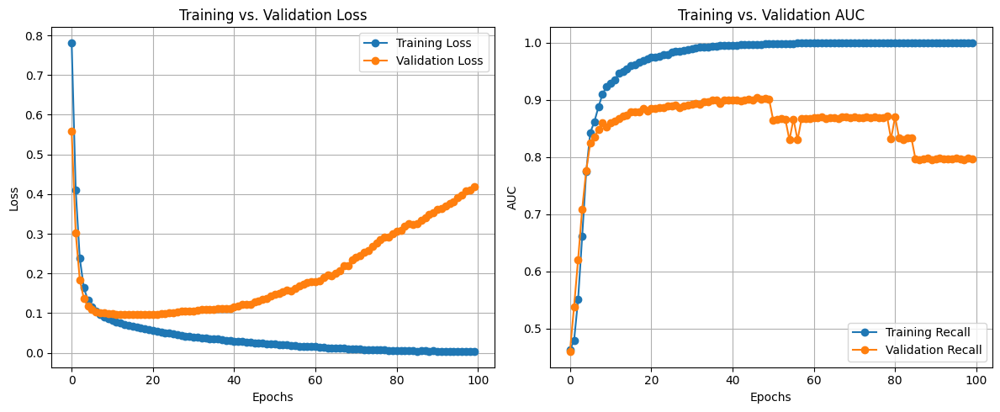

In [ ]:
plt.figure(figsize=(12, 5))

# Plot loss (error) on the left subplot
plt.subplot(1, 2, 1)
plt.plot(history2.history['loss'], label='Training Loss', marker='o')
plt.plot(history2.history['val_loss'], label='Validation Loss', marker='o')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training vs. Validation Loss')
plt.legend()
plt.grid(True)

# Plot precision on the right subplot
plt.subplot(1, 2, 2)
plt.plot(history2.history['AUC'], label='Training Recall', marker='o')
plt.plot(history2.history['val_AUC'], label='Validation Recall', marker='o')
plt.xlabel('Epochs')
plt.ylabel('AUC')
plt.title('Training vs. Validation AUC')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()